In [1]:
import pandas as pd
import pickle
import matplotlib.pyplot as plt
import seaborn
from shapely.geometry import Point
import geopandas as gpd
import folium
from folium.plugins import MarkerCluster
from folium.plugins import FastMarkerCluster

%matplotlib inline 

In [3]:
may_trip = pd.read_csv('../data/may_trip_adj.csv')

In [5]:
may_trip.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 156320 entries, 0 to 156319
Data columns (total 21 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   pubTimeStamp    156320 non-null  object 
 1   companyName     156320 non-null  object 
 2   tripRecordNum   156320 non-null  object 
 3   sumdID          156320 non-null  object 
 4   tripDuration    156320 non-null  float64
 5   tripDistance    156320 non-null  float64
 6   startDate       156320 non-null  object 
 7   startTime       156320 non-null  object 
 8   endDate         156320 non-null  object 
 9   endTime         156320 non-null  object 
 10  startLatitude   156320 non-null  float64
 11  startLongitude  156320 non-null  float64
 12  endLatitude     156320 non-null  float64
 13  endLongitude    156320 non-null  float64
 14  tripRoute       156320 non-null  object 
 15  create_dt       156320 non-null  object 
 16  start           156320 non-null  object 
 17  end       

In [6]:
june_trip = pd.read_csv('../data/june_trip_adj.csv')

In [7]:
july_trip = pd.read_csv('../data/july_trip_adj.csv')

In [8]:
may_trip.describe()

,tripDuration,tripDistance,startLatitude,startLongitude,endLatitude,endLongitude,seconds,minutes
count,156320.000000,156320.000000,156320.000000,156320.000000,156320.000000,156320.000000,156320.000000,156320.000000
mean,22.524736,2336.396540,36.154780,-86.784007,36.155179,-86.784119,581.114500,9.685242
std,102.663723,2346.099949,0.013520,0.013331,0.019613,0.081653,359.525777,5.992096
min,1.000000,0.083756,36.044707,-86.918008,32.775953,-117.076117,60.000000,1.000000
25%,5.000000,389.229600,36.149850,-86.791213,36.150100,-86.791131,299.000000,4.983333
50%,8.366667,1321.308000,36.156700,-86.781473,36.156980,-86.781495,495.278333,8.254639
75%,13.633333,3887.748000,36.162592,-86.776290,36.162530,-86.776370,791.849999,13.197500
max,1643.000000,8759.840000,36.293024,-86.608901,39.768425,-77.021907,1651.600000,27.526667


In [62]:
may_trip.sumdID.value_counts()

Poweredb671ffe4-2bca-5880-98ec-d36f65aa11a2    433
PoweredRJ7YYJTHAR5N3                           258
PoweredEGRN7CFK6Q6K2                           246
PoweredDJQATZBXPBUAE                           240
PoweredWVIAXNCVDNOXP                           239
                                              ... 
Powered221505                                    1
Powered6RTNK                                     1
Powered1PDIE                                     1
PoweredQJBYL                                     1
Powered3953202                                   1
Name: sumdID, Length: 6777, dtype: int64

In [27]:
scooters_avg_day = may_trip.sumdID.value_counts() / 31

In [52]:
scooters_avg_day

Poweredb671ffe4-2bca-5880-98ec-d36f65aa11a2    13.967742
PoweredRJ7YYJTHAR5N3                            8.322581
PoweredEGRN7CFK6Q6K2                            7.935484
PoweredDJQATZBXPBUAE                            7.741935
PoweredWVIAXNCVDNOXP                            7.709677
                                                 ...    
Powered221505                                   0.032258
Powered6RTNK                                    0.032258
Powered1PDIE                                    0.032258
PoweredQJBYL                                    0.032258
Powered3953202                                  0.032258
Name: sumdID, Length: 6777, dtype: float64

In [68]:
scooters_avg_day_df = pd.DataFrame({'sumdID':scooters_avg_day.index, 'avg_rides_day':scooters_avg_day.values})

In [69]:
scooters_avg_day_df.head()

,sumdID,avg_rides_day
0,Poweredb671ffe4-2bca-5880-98ec-d36f65aa11a2,13.967742
1,PoweredRJ7YYJTHAR5N3,8.322581
2,PoweredEGRN7CFK6Q6K2,7.935484
3,PoweredDJQATZBXPBUAE,7.741935
4,PoweredWVIAXNCVDNOXP,7.709677


In [76]:
may_trip = may_trip.merge(scooters_avg_day_df, how='inner', on='sumdID')

In [77]:
may_trip.sort_values(by='avg_rides_day', ascending=False)

,pubTimeStamp,companyName,tripRecordNum,sumdID,tripDuration,tripDistance,startDate,startTime,endDate,endTime,...,endLatitude,endLongitude,tripRoute,create_dt,start,end,totaltime,seconds,minutes,avg_rides_day
136380,2019-05-17 10:31:57,JUMP,JMP459,Poweredb671ffe4-2bca-5880-98ec-d36f65aa11a2,2.785700,792.00000,2019-05-17 00:00:00.000000,07:21:28,2019-05-17 00:00:00.000000,07:24:16,...,36.154232,-86.787310,"[[""36.156351"",""-86.786955""],[""36.156351"",""-86....",2019-05-18 06:20:20.437000,2019-05-17 07:21:28.000000,2019-05-17 07:24:16.000000,0 days 00:02:48,168.000000,2.800000,13.967742
136482,2019-05-17 19:57:20,JUMP,JMP620,Poweredb671ffe4-2bca-5880-98ec-d36f65aa11a2,4.264333,897.60000,2019-05-17 00:00:00.000000,15:13:32,2019-05-17 00:00:00.000000,15:17:48,...,36.153027,-86.795940,"[[""36.151713"",""-86.798428""],[""36.151713"",""-86....",2019-05-18 06:20:42.100000,2019-05-17 15:13:32.000000,2019-05-17 15:17:48.000000,0 days 00:04:16,256.000000,4.266667,13.967742
136471,2019-05-17 19:57:20,JUMP,JMP668,Poweredb671ffe4-2bca-5880-98ec-d36f65aa11a2,11.005016,792.00000,2019-05-17 00:00:00.000000,15:41:24,2019-05-17 00:00:00.000000,15:52:24,...,36.155777,-86.785300,"[[""36.15628"",""-86.785603""],[""36.156306"",""-86.7...",2019-05-18 06:20:43.067000,2019-05-17 15:41:24.000000,2019-05-17 15:52:24.000000,0 days 00:11:00,660.000000,11.000000,13.967742
136472,2019-05-17 19:57:20,JUMP,JMP579,Poweredb671ffe4-2bca-5880-98ec-d36f65aa11a2,10.150967,3907.20000,2019-05-17 00:00:00.000000,14:36:26,2019-05-17 00:00:00.000000,14:46:35,...,36.156720,-86.786920,"[[""36.155908"",""-86.777135""],[""36.155853"",""-86....",2019-05-18 06:20:38.387000,2019-05-17 14:36:26.000000,2019-05-17 14:46:35.000000,0 days 00:10:09,609.000000,10.150000,13.967742
136473,2019-05-17 19:57:20,JUMP,JMP557,Poweredb671ffe4-2bca-5880-98ec-d36f65aa11a2,6.989984,4540.80000,2019-05-17 00:00:00.000000,14:13:47,2019-05-17 00:00:00.000000,14:20:46,...,36.172688,-86.786350,"[[""36.164715"",""-86.795188""],[""36.164715"",""-86....",2019-05-18 06:20:37.580000,2019-05-17 14:13:47.000000,2019-05-17 14:20:46.000000,0 days 00:06:59,419.000000,6.983333,13.967742
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
154738,2019-05-26 19:55:10.243000,Bird,BRD3936,Powered89B6C,14.000000,8530.18400,2019-05-26 00:00:00.000000,19:42:47.726666,2019-05-26 00:00:00.000000,19:56:26.446666,...,36.148700,-86.810200,"[[36.151763,-86.814493],[36.150241,-86.811543]...",2019-05-27 05:32:05.600000,2019-05-26 19:42:47.726666,2019-05-26 19:56:26.446666,0 days 00:13:38.720000,818.720000,13.645333,0.032258
98913,2019-05-03 19:49:08.363000,Bird,BRD1775,PoweredKHZ2B,9.000000,2296.58800,2019-05-03 00:00:00.000000,19:42:12.746666,2019-05-03 00:00:00.000000,19:50:55.063333,...,36.150400,-86.779300,"[[36.153855,-86.784112],[36.153509,-86.783945]...",2019-05-04 05:31:24.423000,2019-05-03 19:42:12.746666,2019-05-03 19:50:55.063333,0 days 00:08:42.316667,522.316667,8.705278,0.032258
9935,2019-05-01 12:36:29.870000,Bird,BRD81,Powered95MP8,3.000000,1332.02104,2019-05-01 00:00:00.000000,12:34:46.023333,2019-05-01 00:00:00.000000,12:37:37.506666,...,36.163900,-86.782400,"[[36.16167,-86.783616],[36.16167,-86.783616],[...",2019-05-02 05:30:57.110000,2019-05-01 12:34:46.023333,2019-05-01 12:37:37.506666,0 days 00:02:51.483333,171.483333,2.858056,0.032258
10152,2019-05-01 13:06:30.783000,Bird,BRD134,Powered4J5IT,7.000000,4156.82428,2019-05-01 00:00:00.000000,12:59:28.626666,2019-05-01 00:00:00.000000,13:06:37.920000,...,36.161700,-86.772800,"[[36.16756,-86.764039],[36.167553,-86.764054],...",2019-05-02 05:30:57.593000,2019-05-01 12:59:28.626666,2019-05-01 13:06:37.920000,0 days 00:07:09.293334,429.293334,7.154889,0.032258


In [81]:
may_trip.companyName.value_counts()

Lime             78268
Lyft             36282
Bird             30925
SPIN              6596
Bolt Mobility     3228
Gotcha             588
JUMP               433
Name: companyName, dtype: int64

In [78]:
abv_avg_co = may_trip.loc[may_trip['avg_rides_day'] >= 3]

In [80]:
abv_avg_co.companyName.value_counts()

Lime    15254
JUMP      433
Name: companyName, dtype: int64

In [135]:
scooters_abv_avg = scooters_avg_day >= 3
scooters_abv_avg

Poweredb671ffe4-2bca-5880-98ec-d36f65aa11a2     True
PoweredRJ7YYJTHAR5N3                            True
PoweredEGRN7CFK6Q6K2                            True
PoweredDJQATZBXPBUAE                            True
PoweredWVIAXNCVDNOXP                            True
                                               ...  
Powered221505                                  False
Powered6RTNK                                   False
Powered1PDIE                                   False
PoweredQJBYL                                   False
Powered3953202                                 False
Name: sumdID, Length: 6777, dtype: bool

In [136]:
scooters_abv_avg.value_counts()

False    6645
True      132
Name: sumdID, dtype: int64

Looks like only 132 scooters had more than 3 rides per day in the month of May, and they were all Lime or JUMP scooters. Below, I want to compare values to the uncleaned dataset. 

In [59]:
may_trip_unclean = pd.read_csv('../data/may_trip.csv')

In [61]:
scooters_unclean = may_trip_unclean.sumdID.value_counts()

scooters_unclean

PoweredUNKNOWN                                 2166
Poweredb671ffe4-2bca-5880-98ec-d36f65aa11a2     600
PoweredWVIAXNCVDNOXP                            338
PoweredR3QXO6TL2HIAB                            291
PoweredRJ7YYJTHAR5N3                            274
                                               ... 
Powered1ME13                                      1
Powered74T24                                      1
Powered527366                                     1
PoweredBF4W5                                      1
PoweredPGY7IKLCK74X4                              1
Name: sumdID, Length: 6966, dtype: int64

In [147]:
query = may_trip.loc[may_trip['sumdID'] == 'PoweredUNKNOWN']

In [149]:
query.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 32 entries, 4645 to 4676
Data columns (total 24 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   pubTimeStamp    32 non-null     object  
 1   companyName     32 non-null     object  
 2   tripRecordNum   32 non-null     object  
 3   sumdID          32 non-null     object  
 4   tripDuration    32 non-null     float64 
 5   tripDistance    32 non-null     float64 
 6   startDate       32 non-null     object  
 7   startTime       32 non-null     object  
 8   endDate         32 non-null     object  
 9   endTime         32 non-null     object  
 10  startLatitude   32 non-null     float64 
 11  startLongitude  32 non-null     float64 
 12  endLatitude     32 non-null     float64 
 13  endLongitude    32 non-null     float64 
 14  tripRoute       32 non-null     object  
 15  create_dt       32 non-null     object  
 16  start           32 non-null     object  
 17  end          

In [155]:
query.describe()

,tripDuration,tripDistance,startLatitude,startLongitude,endLatitude,endLongitude,seconds,minutes,avg_rides_day
count,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000
mean,7.343750,2705.975316,36.158022,-86.781991,36.157581,-86.782022,437.096562,7.284943,1.032258
std,5.637486,2539.965812,0.009451,0.013861,0.008918,0.013596,340.073681,5.667895,0.000000
min,1.000000,9.842520,36.128000,-86.814500,36.128000,-86.814500,66.113333,1.101889,1.032258
25%,3.000000,574.147000,36.152850,-86.789900,36.152850,-86.789850,174.696667,2.911611,1.032258
50%,5.500000,1804.462000,36.159300,-86.780800,36.159300,-86.780850,338.926666,5.648778,1.032258
75%,11.000000,4669.455530,36.162800,-86.777700,36.162800,-86.778400,651.584167,10.859736,1.032258
max,25.000000,8211.942520,36.176200,-86.746900,36.171900,-86.746900,1512.456667,25.207611,1.032258


In [152]:
q = may_trip_unclean.loc[may_trip_unclean['sumdID'] == 'PoweredUNKNOWN']
q

,pubTimeStamp,companyName,tripRecordNum,sumdID,tripDuration,tripDistance,startDate,startTime,endDate,endTime,startLatitude,startLongitude,endLatitude,endLongitude,tripRoute,create_dt,avg_rides_day
1699,2019-05-01 00:25:56.567000,Bird,BRD2254,PoweredUNKNOWN,0.0,0.0,2019-05-01 00:00:00,00:26:58.376666,2019-05-01 00:00:00,00:27:07.540000,36.1518,-86.8152,36.1518,-86.8152,[],2019-05-02 05:30:26.497000,69.870968
1700,2019-05-01 01:05:58.023000,Bird,BRD2413,PoweredUNKNOWN,1.0,0.0,2019-05-01 00:00:00,01:05:18.350000,2019-05-01 00:00:00,01:06:07.786666,36.1402,-86.8062,36.1402,-86.8062,[],2019-05-02 05:30:32.100000,69.870968
1701,2019-05-01 01:05:58.023000,Bird,BRD2412,PoweredUNKNOWN,1.0,0.0,2019-05-01 00:00:00,01:06:31.300000,2019-05-01 00:00:00,01:07:11.496666,36.1402,-86.8062,36.1402,-86.8062,[],2019-05-02 05:30:32.070000,69.870968
1702,2019-05-01 01:10:58.383000,Bird,BRD2442,PoweredUNKNOWN,5.0,0.0,2019-05-01 00:00:00,01:06:45.440000,2019-05-01 00:00:00,01:11:35.563333,36.1612,-86.7843,36.1612,-86.7843,[],2019-05-02 05:30:32.893000,69.870968
1703,2019-05-01 01:10:58.383000,Bird,BRD2441,PoweredUNKNOWN,0.0,0.0,2019-05-01 00:00:00,01:11:40.936666,2019-05-01 00:00:00,01:11:52.916666,36.1571,-86.7651,36.1571,-86.7651,[],2019-05-02 05:30:32.827000,69.870968
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3860,2019-05-31 23:15:44.663000,Bird,BRD3246,PoweredUNKNOWN,0.0,0.0,2019-05-31 00:00:00,23:16:52.573333,2019-05-31 00:00:00,23:17:19.696666,36.1430,-86.7992,36.1430,-86.7992,[],2019-06-01 05:31:34.550000,69.870968
3861,2019-05-31 23:30:45.293000,Bird,BRD3366,PoweredUNKNOWN,0.0,0.0,2019-05-31 00:00:00,23:30:59.600000,2019-05-31 00:00:00,23:31:03.150000,36.1552,-86.7763,36.1552,-86.7763,[],2019-06-01 05:31:36.093000,69.870968
3862,2019-05-31 23:35:45.407000,Bird,BRD3405,PoweredUNKNOWN,2.0,0.0,2019-05-31 00:00:00,23:34:28.253333,2019-05-31 00:00:00,23:36:06.503333,36.1650,-86.7763,36.1650,-86.7763,[],2019-06-01 05:31:36.500000,69.870968
3863,2019-05-31 23:50:46.233000,Bird,BRD3504,PoweredUNKNOWN,1.0,0.0,2019-05-31 00:00:00,23:51:28.176666,2019-05-31 00:00:00,23:52:05.050000,36.1578,-86.8171,36.1578,-86.8171,[],2019-06-01 05:31:38.027000,69.870968


In [153]:
q.companyName.value_counts()

Bird    2166
Name: companyName, dtype: int64

In [154]:
q.describe()

,tripDuration,tripDistance,startLatitude,startLongitude,endLatitude,endLongitude,avg_rides_day
count,2166.000000,2166.000000,2166.000000,2166.000000,2166.000000,2166.000000,2166.000000
mean,1.727608,81.165195,36.157923,-86.783778,36.157915,-86.783769,69.870968
std,3.434056,881.957064,0.009604,0.012019,0.009598,0.012016,0.000000
min,0.000000,0.000000,36.121700,-86.820800,36.121700,-86.820800,69.870968
25%,0.000000,0.000000,36.152700,-86.789300,36.152700,-86.789300,69.870968
50%,0.000000,0.000000,36.159600,-86.780850,36.159600,-86.780900,69.870968
75%,2.000000,0.000000,36.162800,-86.776700,36.162800,-86.776700,69.870968
max,35.000000,18700.788000,36.195100,-86.726700,36.195100,-86.726700,69.870968


Nearly ALL of the PoweredUNKNOWN scooters were taken out in clean up. All of them are Bird. 

In [63]:
unclean_avg_day = may_trip_unclean.sumdID.value_counts() / 31
unclean_avg_day

PoweredUNKNOWN                                 69.870968
Poweredb671ffe4-2bca-5880-98ec-d36f65aa11a2    19.354839
PoweredWVIAXNCVDNOXP                           10.903226
PoweredR3QXO6TL2HIAB                            9.387097
PoweredRJ7YYJTHAR5N3                            8.838710
                                                 ...    
Powered1ME13                                    0.032258
Powered74T24                                    0.032258
Powered527366                                   0.032258
PoweredBF4W5                                    0.032258
PoweredPGY7IKLCK74X4                            0.032258
Name: sumdID, Length: 6966, dtype: float64

In [64]:
unclean_abv_avg = unclean_avg_day >= 3
unclean_abv_avg

PoweredUNKNOWN                                  True
Poweredb671ffe4-2bca-5880-98ec-d36f65aa11a2     True
PoweredWVIAXNCVDNOXP                            True
PoweredR3QXO6TL2HIAB                            True
PoweredRJ7YYJTHAR5N3                            True
                                               ...  
Powered1ME13                                   False
Powered74T24                                   False
Powered527366                                  False
PoweredBF4W5                                   False
PoweredPGY7IKLCK74X4                           False
Name: sumdID, Length: 6966, dtype: bool

In [65]:
unclean_abv_avg.value_counts()

False    6586
True      380
Name: sumdID, dtype: int64

In [83]:
unclean_scooters_avg_day_df = pd.DataFrame({'sumdID':unclean_avg_day.index, 'avg_rides_day':unclean_avg_day.values})

In [85]:
may_trip_unclean = may_trip_unclean.merge(unclean_scooters_avg_day_df, how='inner', on='sumdID')

In [86]:
abv_avg_co_unclean = may_trip_unclean.loc[may_trip_unclean['avg_rides_day'] >= 3]

In [87]:
abv_avg_co_unclean.companyName.value_counts()

Lime    44647
Bird     2166
JUMP      600
Name: companyName, dtype: int64

Even in the unclean dataset, only Lime, Bird, and JUMP had any scooters that averaged over 3 rides per day, distance not considered.

**Now I want to take a look at some maps.

In [97]:
zipcodes = gpd.read_file(r"C:\Users\chris\Documents\nss-data-analytics\projects\da5-geospatial-python-workshop-chrismack698\data\zipcodes.geojson")

In [98]:
zipcodes

,zip,objectid,po_name,shape_stlength,shape_starea,geometry
0,37115,1,MADISON,178783.02488886821,596553400.57885742,"MULTIPOLYGON (((-86.68725 36.31821, -86.68722 ..."
1,37216,3,NASHVILLE,75820.997821400058,188884682.28344727,"MULTIPOLYGON (((-86.73451 36.23774, -86.73425 ..."
2,37204,9,NASHVILLE,93180.292250425613,200664795.51708984,"MULTIPOLYGON (((-86.77914 36.13424, -86.77923 ..."
3,37027,11,BRENTWOOD,159760.6942933173,174978422.04101562,"MULTIPOLYGON (((-86.81258 36.06319, -86.81263 ..."
4,37064,18,FRANKLIN,28995.828320601937,46969608.005737305,"MULTIPOLYGON (((-87.02197 36.01200, -87.02140 ..."
5,37143,23,PEGRAM,7047.8267580476522,1900364.756652832,"MULTIPOLYGON (((-87.03553 36.08659, -87.03556 ..."
6,37080,42,JOELTON,2319.8074237329579,56522.611450195313,"MULTIPOLYGON (((-86.86263 36.37811, -86.86264 ..."
7,37221,17,NASHVILLE,241372.3112694624,1266395059.4877319,"MULTIPOLYGON (((-86.97084 36.11644, -86.97084 ..."
8,37072,47,GOODLETTSVILLE,225242.45424953851,1094968706.7701416,"MULTIPOLYGON (((-86.75361 36.40428, -86.75354 ..."
9,37212,54,NASHVILLE,58759.243654332378,73920091.147705078,"MULTIPOLYGON (((-86.80790 36.14643, -86.80605 ..."


In [99]:
may_trip['start_geometry'] = may_trip.apply(lambda x: Point((x.startLongitude, 
                                                         x.startLatitude)), 
                                        axis=1)
may_trip.head(3)

,pubTimeStamp,companyName,tripRecordNum,sumdID,tripDuration,tripDistance,startDate,startTime,endDate,endTime,...,endLongitude,tripRoute,create_dt,start,end,totaltime,seconds,minutes,avg_rides_day,start_geometry
0,2019-05-01 00:00:55.423000,Bird,BRD2134,Powered9EAJL,3.0,958.00528,2019-05-01 00:00:00.000000,00:00:20.460000,2019-05-01 00:00:00.000000,00:02:52.346666,...,-86.8067,"[[36.157235,-86.803612],[36.157235,-86.80362],...",2019-05-02 05:30:23.780000,2019-05-01 00:00:20.460000,2019-05-01 00:02:52.346666,0 days 00:02:31.886666,151.886666,2.531444,0.129032,POINT (-86.8036 36.1571)
1,2019-05-02 03:37:11.417000,Bird,BRD2352,Powered9EAJL,7.0,4488.18912,2019-05-02 00:00:00.000000,03:30:18.376666,2019-05-02 00:00:00.000000,03:37:47.066666,...,-86.8070,"[[36.150866,-86.796952],[36.150866,-86.796952]...",2019-05-03 05:30:31.620000,2019-05-02 03:30:18.376666,2019-05-02 03:37:47.066666,0 days 00:07:28.690000,448.690000,7.478167,0.129032,POINT (-86.7968 36.1507)
2,2019-05-03 19:09:06.420000,Bird,BRD1534,Powered9EAJL,15.0,7500.00024,2019-05-03 00:00:00.000000,18:54:18.040000,2019-05-03 00:00:00.000000,19:09:19.356666,...,-86.7734,"[[36.156886,-86.775284],[36.156886,-86.775284]...",2019-05-04 05:31:20.147000,2019-05-03 18:54:18.040000,2019-05-03 19:09:19.356666,0 days 00:15:01.316666,901.316666,15.021944,0.129032,POINT (-86.77500000000001 36.1563)


In [100]:
may_geo = gpd.GeoDataFrame(may_trip, 
                           crs = zipcodes.crs, 
                           geometry = may_trip['start_geometry'])

In [102]:
rides_in_zip = gpd.sjoin(may_geo, zipcodes, op = 'within')

In [105]:
rides_in_zip.zip.value_counts()

37203    68132
37201    26891
37219    12825
37212    12417
37204    10990
37206     6032
37208     6002
37213     5586
37210     3434
37240     1173
37232     1100
37207      618
37209      373
37215      277
37216      140
37205      131
37228      131
37211       26
37217       20
37214        9
37221        4
37013        3
37115        3
37218        1
37138        1
37220        1
Name: zip, dtype: int64

In [110]:
top_5_zip = rides_in_zip.loc[rides_in_zip['zip'].isin(['37203', '37201', '37219', '37212', '37204'])]

In [114]:
top_5_zip.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 131255 entries, 0 to 156294
Data columns (total 30 columns):
 #   Column          Non-Null Count   Dtype   
---  ------          --------------   -----   
 0   pubTimeStamp    131255 non-null  object  
 1   companyName     131255 non-null  object  
 2   tripRecordNum   131255 non-null  object  
 3   sumdID          131255 non-null  object  
 4   tripDuration    131255 non-null  float64 
 5   tripDistance    131255 non-null  float64 
 6   startDate       131255 non-null  object  
 7   startTime       131255 non-null  object  
 8   endDate         131255 non-null  object  
 9   endTime         131255 non-null  object  
 10  startLatitude   131255 non-null  float64 
 11  startLongitude  131255 non-null  float64 
 12  endLatitude     131255 non-null  float64 
 13  endLongitude    131255 non-null  float64 
 14  tripRoute       131255 non-null  object  
 15  create_dt       131255 non-null  object  
 16  start           131255 non-nul

In [115]:
polygon_top_5 = zipcodes.loc[zipcodes['zip'].isin(['37203', '37201', '37219', '37212', '37204'])]

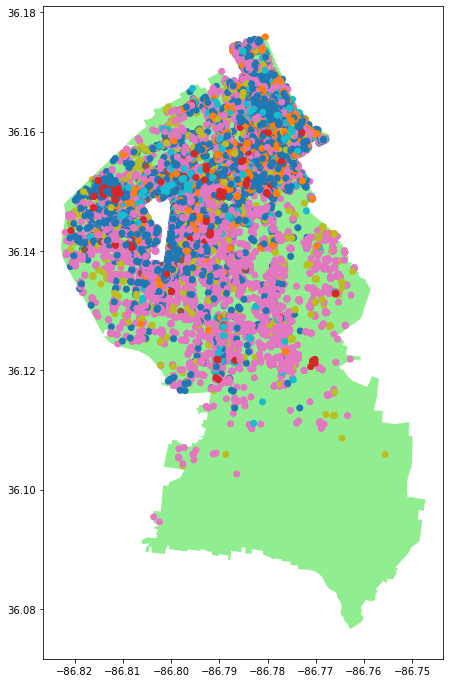

In [117]:
ax = polygon_top_5.plot(figsize = (12, 12), color = 'lightgreen')
top_5_zip.plot( ax = ax, column = 'companyName');
plt.show();

In [118]:
polygon_top_5.centroid

C:\Users\chris\AppData\Local\Temp/ipykernel_12996/1937763530.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  polygon_top_5.centroid


2     POINT (-86.77467 36.10566)
9     POINT (-86.80157 36.13335)
24    POINT (-86.78317 36.16682)
35    POINT (-86.78899 36.14860)
36    POINT (-86.77702 36.16557)
dtype: geometry

In [120]:
center = polygon_top_5.centroid[2]
print(center)

POINT (-86.7746655408201 36.10566266613879)


C:\Users\chris\AppData\Local\Temp/ipykernel_12996/418046642.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center = polygon_top_5.centroid[2]


In [121]:
area_center = [center.y, center.x]

In [260]:
map_top_zip = folium.Map(location =  area_center, zoom_start = 12)

folium.GeoJson(polygon_top_5).add_to(map_top_zip)

#create a list of locations and pass them to FastMarkerCluster()
locations = rides_in_zip[['startLatitude', 'startLongitude']].values.tolist()
map_top_zip.add_child(
    FastMarkerCluster(locations)
)


map_top_zip.save('../maps/map_top_zip.html')
#display our map
map_top_zip

In [131]:
june_trip.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 136802 entries, 0 to 136801
Data columns (total 21 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   pubTimeStamp    136802 non-null  object 
 1   companyName     136802 non-null  object 
 2   tripRecordNum   136802 non-null  object 
 3   sumdID          136802 non-null  object 
 4   tripDuration    136802 non-null  float64
 5   tripDistance    136802 non-null  float64
 6   startDate       136802 non-null  object 
 7   startTime       136802 non-null  object 
 8   endDate         136802 non-null  object 
 9   endTime         136802 non-null  object 
 10  startLatitude   136802 non-null  float64
 11  startLongitude  136802 non-null  float64
 12  endLatitude     136802 non-null  float64
 13  endLongitude    136802 non-null  float64
 14  tripRoute       136802 non-null  object 
 15  create_dt       136802 non-null  object 
 16  start           136802 non-null  object 
 17  end       

In [132]:
june_trip.sumdID.value_counts()

Poweredb671ffe4-2bca-5880-98ec-d36f65aa11a2    987
PoweredSQWMJWTIGM6DS                           127
Powered7UN7P27A5HR5H                           117
PoweredOQ3DRY64KZBYS                           117
Powered3ZPCHCTLNK2WR                           114
                                              ... 
PoweredBTN55                                     1
Powered4656395                                   1
PoweredJAQ5S                                     1
PoweredJZVTM                                     1
PoweredDGVRIYHXJVPI6                             1
Name: sumdID, Length: 6441, dtype: int64

In [134]:
scooters_avg_day_june = june_trip.sumdID.value_counts() / 30
scooters_avg_day_june

Poweredb671ffe4-2bca-5880-98ec-d36f65aa11a2    32.900000
PoweredSQWMJWTIGM6DS                            4.233333
Powered7UN7P27A5HR5H                            3.900000
PoweredOQ3DRY64KZBYS                            3.900000
Powered3ZPCHCTLNK2WR                            3.800000
                                                 ...    
PoweredBTN55                                    0.033333
Powered4656395                                  0.033333
PoweredJAQ5S                                    0.033333
PoweredJZVTM                                    0.033333
PoweredDGVRIYHXJVPI6                            0.033333
Name: sumdID, Length: 6441, dtype: float64

In [137]:
scooters_avg_day_june_df = pd.DataFrame({'sumdID':scooters_avg_day_june.index, 'avg_rides_day':scooters_avg_day_june.values})

In [138]:
june_trip = june_trip.merge(scooters_avg_day_june_df, how='inner', on='sumdID')

In [139]:
june_trip.companyName.value_counts()

Lime             64073
Lyft             27358
Bird             24309
SPIN             11227
Bolt Mobility     6916
Gotcha            1637
JUMP              1282
Name: companyName, dtype: int64

In [140]:
abv_avg_co_june = june_trip.loc[june_trip['avg_rides_day'] >= 3]

In [141]:
abv_avg_co_june.companyName.value_counts()

Lime    4776
JUMP     987
Name: companyName, dtype: int64

In [142]:
scooters_abv_avg_june = scooters_avg_day_june >= 3
scooters_abv_avg_june

Poweredb671ffe4-2bca-5880-98ec-d36f65aa11a2     True
PoweredSQWMJWTIGM6DS                            True
Powered7UN7P27A5HR5H                            True
PoweredOQ3DRY64KZBYS                            True
Powered3ZPCHCTLNK2WR                            True
                                               ...  
PoweredBTN55                                   False
Powered4656395                                 False
PoweredJAQ5S                                   False
PoweredJZVTM                                   False
PoweredDGVRIYHXJVPI6                           False
Name: sumdID, Length: 6441, dtype: bool

In [143]:
scooters_abv_avg_june.value_counts()

False    6392
True       49
Name: sumdID, dtype: int64

In [144]:
june_trip_unclean = pd.read_csv('../data/june_trip.csv')

In [146]:
scooters_unclean_june = june_trip_unclean.sumdID.value_counts()

scooters_unclean_june

Poweredb671ffe4-2bca-5880-98ec-d36f65aa11a2    1308
PoweredUNKNOWN                                 1120
PoweredSQWMJWTIGM6DS                            158
PoweredOQ3DRY64KZBYS                            158
Powered3ZPCHCTLNK2WR                            144
                                               ... 
Powered6ZWUS                                      1
PoweredTDSXRLIJ4XYQY                              1
Powered4KWEF                                      1
Powered5TPLMIM2ERERA                              1
Poweredc2d0a425-86dd-5664-a036-d770559391bb       1
Name: sumdID, Length: 6742, dtype: int64

Again, PoweredUNKNOWN rearing its head. I'll do a search eventually to check and see which company that is. 

In [157]:
scooters_unclean_avg_june = june_trip_unclean.sumdID.value_counts() / 30

In [158]:
scooters_avg_day_unclean_june_df = pd.DataFrame({'sumdID':scooters_unclean_avg_june.index, 'avg_rides_day':scooters_unclean_avg_june.values}) 

In [159]:
june_trip_unclean = june_trip_unclean.merge(scooters_avg_day_unclean_june_df, how='inner', on='sumdID')

In [160]:
june_trip_unclean.companyName.value_counts()

Lime             84728
Bird             55014
Lyft             37821
SPIN             14294
Bolt Mobility    10219
Gotcha            1803
JUMP              1748
Name: companyName, dtype: int64

In [161]:
abv_avg_co_unclean_june = june_trip_unclean.loc[june_trip_unclean['avg_rides_day'] >= 3]

In [162]:
abv_avg_co_unclean_june.companyName.value_counts()

Lime    28908
JUMP     1308
Bird     1120
Lyft      182
Name: companyName, dtype: int64

In [163]:
scooters_abv_avg_unclean_june = scooters_unclean_avg_june >= 3
scooters_abv_avg_unclean_june

Poweredb671ffe4-2bca-5880-98ec-d36f65aa11a2     True
PoweredUNKNOWN                                  True
PoweredSQWMJWTIGM6DS                            True
PoweredOQ3DRY64KZBYS                            True
Powered3ZPCHCTLNK2WR                            True
                                               ...  
Powered6ZWUS                                   False
PoweredTDSXRLIJ4XYQY                           False
Powered4KWEF                                   False
Powered5TPLMIM2ERERA                           False
Poweredc2d0a425-86dd-5664-a036-d770559391bb    False
Name: sumdID, Length: 6742, dtype: bool

In [164]:
scooters_abv_avg_unclean_june.value_counts()

False    6464
True      278
Name: sumdID, dtype: int64

In [165]:
june_trip['start_geometry'] = june_trip.apply(lambda x: Point((x.startLongitude, 
                                                         x.startLatitude)), 
                                        axis=1)
june_trip.head(3)

,pubTimeStamp,companyName,tripRecordNum,sumdID,tripDuration,tripDistance,startDate,startTime,endDate,endTime,...,endLongitude,tripRoute,create_dt,start,end,totaltime,seconds,minutes,avg_rides_day,start_geometry
0,2019-06-01 00:05:46.817000,Bird,BRD3572,PoweredSPI1T,4.0,328.084,2019-06-01 00:00:00.000000,00:02:18.203333,2019-06-01 00:00:00.000000,00:06:16.406666,...,-86.7802,"[[36.164679,-86.781089],[36.163693,-86.78011],...",2019-06-02 05:30:19.960000,2019-06-01 00:02:18.203333,2019-06-01 00:06:16.406666,0 days 00:03:58.203333,238.203333,3.970056,0.466667,POINT (-86.7807 36.1644)
1,2019-06-01 00:10:46.957000,Bird,BRD3612,PoweredSPI1T,5.0,656.168,2019-06-01 00:00:00.000000,00:07:21.430000,2019-06-01 00:00:00.000000,00:12:30.913333,...,-86.7778,"[[36.164951,-86.779836],[36.16494,-86.779456],...",2019-06-02 05:30:20.347000,2019-06-01 00:07:21.430000,2019-06-01 00:12:30.913333,0 days 00:05:09.483333,309.483333,5.158056,0.466667,POINT (-86.7799 36.165)
2,2019-06-03 13:48:39.923000,Bird,BRD177,PoweredSPI1T,5.0,1312.336,2019-06-03 00:00:00.000000,13:44:01.400000,2019-06-03 00:00:00.000000,13:49:27.150000,...,-86.7791,"[[36.164358,-86.779304],[36.163493,-86.779832]...",2019-06-04 05:30:53.530000,2019-06-03 13:44:01.400000,2019-06-03 13:49:27.150000,0 days 00:05:25.750000,325.750000,5.429167,0.466667,POINT (-86.7794 36.1645)


In [222]:
june_geo = gpd.GeoDataFrame(june_trip, 
                           crs = zipcodes.crs, 
                           geometry = june_trip['start_geometry'])

In [223]:
rides_in_zip_june = gpd.sjoin(june_geo, zipcodes, op = 'within')

In [259]:
map_top_zip_june = folium.Map(location =  area_center, zoom_start = 12)

folium.GeoJson(polygon_top_5).add_to(map_top_zip_june)

#create a list of locations and pass them to FastMarkerCluster()
locations = rides_in_zip_june[['startLatitude', 'startLongitude']].values.tolist()
map_top_zip_june.add_child(
    FastMarkerCluster(locations)
)


map_top_zip_june.save('../maps/map_top_zip_june.html')
#display our map
map_top_zip_june

Now, for July.

In [176]:
july_trip.sumdID.value_counts()

PoweredIHGSNSRXCZ2ZG                           102
PoweredOEHCPCAUHESR5                           102
PoweredFE7MM22M6BBJV                           101
PoweredMKPBZS2PEITKN                            98
Powered7FV7FFP2MV66S                            97
                                              ... 
Powered43220858-78e1-5dc5-b323-102249ba5df2      1
PoweredKARQZ                                     1
PoweredDX6L3                                     1
PoweredQUVC6                                     1
PoweredSHTQF4XVPWS3V                             1
Name: sumdID, Length: 5246, dtype: int64

In [177]:
scooters_avg_day_july = july_trip.sumdID.value_counts() / 31
scooters_avg_day_july

PoweredIHGSNSRXCZ2ZG                           3.290323
PoweredOEHCPCAUHESR5                           3.290323
PoweredFE7MM22M6BBJV                           3.258065
PoweredMKPBZS2PEITKN                           3.161290
Powered7FV7FFP2MV66S                           3.129032
                                                 ...   
Powered43220858-78e1-5dc5-b323-102249ba5df2    0.032258
PoweredKARQZ                                   0.032258
PoweredDX6L3                                   0.032258
PoweredQUVC6                                   0.032258
PoweredSHTQF4XVPWS3V                           0.032258
Name: sumdID, Length: 5246, dtype: float64

Wow, right off the bat seeing some differences.

In [178]:
scooters_avg_day_july_df = pd.DataFrame({'sumdID':scooters_avg_day_july.index, 'avg_rides_day':scooters_avg_day_july.values})

In [179]:
july_trip = july_trip.merge(scooters_avg_day_july_df, how='inner', on='sumdID')

In [180]:
july_trip.companyName.value_counts()

Lime             28823
Lyft             22154
Bird             15458
SPIN              9187
Bolt Mobility     4468
JUMP              3044
Gotcha             804
Name: companyName, dtype: int64

In [181]:
abv_avg_co_july = july_trip.loc[july_trip['avg_rides_day'] >= 3]

In [182]:
abv_avg_co_july.companyName.value_counts()

Lime    880
Name: companyName, dtype: int64

In [183]:
scooters_abv_avg_july = scooters_avg_day_july >= 3
scooters_abv_avg_july

PoweredIHGSNSRXCZ2ZG                            True
PoweredOEHCPCAUHESR5                            True
PoweredFE7MM22M6BBJV                            True
PoweredMKPBZS2PEITKN                            True
Powered7FV7FFP2MV66S                            True
                                               ...  
Powered43220858-78e1-5dc5-b323-102249ba5df2    False
PoweredKARQZ                                   False
PoweredDX6L3                                   False
PoweredQUVC6                                   False
PoweredSHTQF4XVPWS3V                           False
Name: sumdID, Length: 5246, dtype: bool

In [184]:
scooters_abv_avg_july.value_counts()

False    5237
True        9
Name: sumdID, dtype: int64

In [185]:
july_trip_unclean = pd.read_csv('../data/july_trip.csv')

In [186]:
scooters_unclean_july = july_trip_unclean.sumdID.value_counts()

scooters_unclean_july

PoweredUNKNOWN          327
Powered5N5J5BJDODHYX    141
PoweredOEHCPCAUHESR5    134
PoweredIHGSNSRXCZ2ZG    128
Powered5BW4GPYGBMUTL    126
                       ... 
PoweredUJHQ7              1
PoweredJXSCI              1
Powered3655517            1
PoweredKURT7              1
PoweredVNWRA              1
Name: sumdID, Length: 5585, dtype: int64

In [190]:
scooters_unclean_avg_july = july_trip_unclean.sumdID.value_counts() / 31

In [187]:
abv_avg_co_unclean_july = july_trip_unclean.loc[june_trip_unclean['avg_rides_day'] >= 3]

In [188]:
abv_avg_co_unclean_july.companyName.value_counts()

Bird             8844
Lime             6602
Lyft             5291
SPIN             2158
Bolt Mobility    1377
JUMP             1080
Gotcha            226
Name: companyName, dtype: int64

In [191]:
scooters_abv_avg_unclean_july = scooters_unclean_avg_july >= 3
scooters_abv_avg_unclean_july

PoweredUNKNOWN           True
Powered5N5J5BJDODHYX     True
PoweredOEHCPCAUHESR5     True
PoweredIHGSNSRXCZ2ZG     True
Powered5BW4GPYGBMUTL     True
                        ...  
PoweredUJHQ7            False
PoweredJXSCI            False
Powered3655517          False
PoweredKURT7            False
PoweredVNWRA            False
Name: sumdID, Length: 5585, dtype: bool

In [193]:
scooters_abv_avg_unclean_july.value_counts()

False    5482
True      103
Name: sumdID, dtype: int64

In [216]:
july_trip['start_geometry'] = july_trip.apply(lambda x: Point((x.startLongitude, 
                                                         x.startLatitude)), 
                                        axis=1)
july_trip.head(3)

,pubTimeStamp,companyName,tripRecordNum,sumdID,tripDuration,tripDistance,startDate,startTime,endDate,endTime,...,tripRoute,create_dt,start,end,totaltime,seconds,minutes,avg_rides_day,start_geometry,geometry
0,2019-07-01 00:03:52.060000,Lyft,LFT7,Powered840423,3.716183,2375.32816,2019-07-01 00:00:00.000000,00:00:08.963333,2019-07-01 00:00:00.000000,00:03:51.933333,...,"[[36.14933,-86.7976],[36.14942,-86.7975],[36.1...",2019-07-02 09:34:36.953000,2019-07-01 00:00:08.963333,2019-07-01 00:03:51.933333,0 days 00:03:42.970000,222.970000,3.716167,1.387097,POINT (-86.7976 36.14933),POINT (-86.79760 36.14933)
1,2019-07-01 00:11:17.113000,Lyft,LFT18,Powered840423,4.432367,3851.70616,2019-07-01 00:00:00.000000,00:06:50.833333,2019-07-01 00:00:00.000000,00:11:16.776666,...,"[[36.15265,-86.79709],[36.15253,-86.79731],[36...",2019-07-02 09:34:37.320000,2019-07-01 00:06:50.833333,2019-07-01 00:11:16.776666,0 days 00:04:25.943333,265.943333,4.432389,1.387097,POINT (-86.79709 36.15265),POINT (-86.79709 36.15265)
2,2019-07-01 00:53:04.203000,Lyft,LFT76,Powered840423,15.563183,7972.44120,2019-07-01 00:00:00.000000,00:37:30.296666,2019-07-01 00:00:00.000000,00:53:04.086666,...,"[[36.14804,-86.80794],[36.14799,-86.80799],[36...",2019-07-02 09:34:39.173000,2019-07-01 00:37:30.296666,2019-07-01 00:53:04.086666,0 days 00:15:33.790000,933.790000,15.563167,1.387097,POINT (-86.80794 36.14804),POINT (-86.80794 36.14804)


In [217]:
july_geo = gpd.GeoDataFrame(july_trip, 
                           crs = zipcodes.crs, 
                           geometry = july_trip['start_geometry'])

In [218]:
rides_in_zip_july = gpd.sjoin(july_geo, zipcodes, op = 'within')

In [258]:
map_top_zip_july = folium.Map(location =  area_center, zoom_start = 12)

folium.GeoJson(polygon_top_5).add_to(map_top_zip_july)

#create a list of locations and pass them to FastMarkerCluster()
locations = rides_in_zip_july[['startLatitude', 'startLongitude']].values.tolist()
map_top_zip_july.add_child(
    FastMarkerCluster(locations)
)


map_top_zip_july.save('../maps/map_top_zip_july.html')
#display our map
map_top_zip_july

In [203]:
zipcodes.head()

,zip,objectid,po_name,shape_stlength,shape_starea,geometry
0,37115,1,MADISON,178783.02488886821,596553400.57885742,"MULTIPOLYGON (((-86.68725 36.31821, -86.68722 ..."
1,37216,3,NASHVILLE,75820.997821400058,188884682.28344727,"MULTIPOLYGON (((-86.73451 36.23774, -86.73425 ..."
2,37204,9,NASHVILLE,93180.292250425613,200664795.51708984,"MULTIPOLYGON (((-86.77914 36.13424, -86.77923 ..."
3,37027,11,BRENTWOOD,159760.6942933173,174978422.04101562,"MULTIPOLYGON (((-86.81258 36.06319, -86.81263 ..."
4,37064,18,FRANKLIN,28995.828320601937,46969608.005737305,"MULTIPOLYGON (((-87.02197 36.01200, -87.02140 ..."


In [208]:
rides_in_zip.zip.value_counts()

37203    68132
37201    26891
37219    12825
37212    12417
37204    10990
37206     6032
37208     6002
37213     5586
37210     3434
37240     1173
37232     1100
37207      618
37209      373
37215      277
37216      140
37205      131
37228      131
37211       26
37217       20
37214        9
37221        4
37013        3
37115        3
37218        1
37138        1
37220        1
Name: zip, dtype: int64

In [225]:
rides_in_zip_june.zip.value_counts()

37203    63994
37201    24238
37219    11408
37212     7890
37204     6103
37208     6075
37213     5322
37206     4835
37210     3657
37240     1245
37232      608
37207      587
37209      457
37228      102
37216       82
37205       68
37215       62
37211       24
37214       17
37218       12
37013        9
37115        3
37221        2
37072        1
37217        1
Name: zip, dtype: int64

In [226]:
rides_in_zip_july.zip.value_counts()

37203    40961
37201    16300
37219     7411
37212     3858
37208     3665
37213     2979
37206     2580
37204     2241
37210     1932
37240      965
37232      370
37207      293
37209      236
37228       42
37216       31
37205       23
37215       18
37013       12
37211        9
37217        4
37221        3
37218        2
37220        1
37115        1
37214        1
Name: zip, dtype: int64

In [235]:
r = rides_in_zip.groupby('zip')['sumdID'].nunique()
r.sort_values(ascending=False)

zip
37203    6402
37201    5537
37219    4453
37212    2854
37213    2701
37208    2499
37206    2154
37210    2063
37204    1429
37240     756
37232     570
37207     433
37209     250
37216     112
37228      87
37205      48
37215      45
37211      21
37217      13
37214       8
37115       3
37221       3
37013       3
37218       1
37138       1
37220       1
Name: sumdID, dtype: int64

In [236]:
r2 = rides_in_zip_june.groupby('zip')['sumdID'].nunique()
r2.sort_values(ascending=False)

zip
37203    6033
37201    5143
37219    3957
37212    2719
37213    2613
37208    2560
37210    2106
37206    2041
37204    1403
37240     854
37207     407
37232     399
37209     318
37228      76
37216      64
37205      49
37215      28
37211      18
37214      11
37013       8
37218       6
37115       3
37221       2
37217       1
37072       1
Name: sumdID, dtype: int64

In [237]:
r3 = rides_in_zip_july.groupby('zip')['sumdID'].nunique()
r3.sort_values(ascending=False)

zip
37203    4736
37201    3848
37219    2836
37212    1893
37208    1789
37213    1630
37210    1279
37206    1239
37204     865
37240     681
37232     300
37207     224
37209     195
37228      29
37216      20
37205      19
37215      13
37211       9
37217       3
37218       2
37013       2
37115       1
37214       1
37220       1
37221       1
Name: sumdID, dtype: int64

In [249]:
r_df = pd.DataFrame({'zip':r.index, 'number_scooters':r.values})

In [250]:
r2_df = pd.DataFrame({'zip':r2.index, 'number_scooters':r2.values})

In [251]:
r3_df = pd.DataFrame({'zip':r3.index, 'number_scooters':r3.values})

In [305]:
r_merge = r_df.merge(r2_df, on='zip')

In [306]:
r_merge = r_merge.merge(r3_df, on = 'zip')
r_merge 

,zip,number_scooters_x,number_scooters_y,number_scooters
0,37013,3,8,2
1,37115,3,3,1
2,37201,5537,5143,3848
3,37203,6402,6033,4736
4,37204,1429,1403,865
5,37205,48,49,19
6,37206,2154,2041,1239
7,37207,433,407,224
8,37208,2499,2560,1789
9,37209,250,318,195


In [310]:
r_merge = r_merge.rename(columns={'number_scooters_x':'scooters_may','number_scooters_y':'scooters_june','number_scooters':'scooters_july'})
r_merge = r_merge.sort_values(by='scooters_may', ascending=False)
r_merge

,zip,scooters_may,scooters_june,scooters_july
3,37203,6402,6033,4736
2,37201,5537,5143,3848
19,37219,4453,3957,2836
12,37212,2854,2719,1893
13,37213,2701,2613,1630
8,37208,2499,2560,1789
6,37206,2154,2041,1239
10,37210,2063,2106,1279
4,37204,1429,1403,865
23,37240,756,854,681


In [317]:
r_merge.set_index('zip', inplace=True)
r_merge

,scooters_may,scooters_june,scooters_july
zip,,,
37203,6402,6033,4736
37201,5537,5143,3848
37219,4453,3957,2836
37212,2854,2719,1893
37213,2701,2613,1630
37208,2499,2560,1789
37206,2154,2041,1239
37210,2063,2106,1279
37204,1429,1403,865


In [282]:
rall

zip
37013       3
37115       3
37138       1
37201    5537
37203    6402
         ... 
37220       1
37221       1
37228      29
37232     300
37240     681
Name: sumdID, Length: 76, dtype: int64

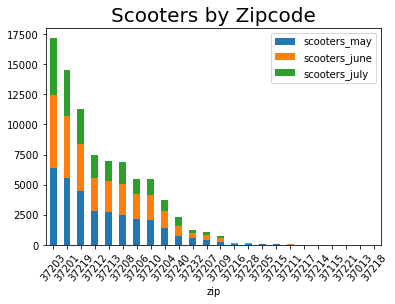

In [338]:
fig = r_merge.plot(kind='bar', stacked=True)
plt.xticks(rotation=50)
fig.set_title('Scooters by Zipcode', fontsize=20)

plt.savefig('../images/scooter_zipcodes.png')

In [257]:
may_trip_unclean.groupby('companyName')['sumdID'].nunique()

companyName
Bird             2945
Bolt Mobility     342
Gotcha            105
JUMP                1
Lime             1576
Lyft             1361
SPIN              636
Name: sumdID, dtype: int64

In [262]:
june_trip_unclean.groupby('companyName')['sumdID'].nunique()

companyName
Bird             2864
Bolt Mobility     329
Gotcha            133
JUMP              182
Lime             1423
Lyft             1141
SPIN              670
Name: sumdID, dtype: int64

In [263]:
july_trip_unclean.groupby('companyName')['sumdID'].nunique()

companyName
Bird             2471
Bolt Mobility     268
Gotcha            103
JUMP              409
Lime              810
Lyft             1012
SPIN              512
Name: sumdID, dtype: int64

In [347]:
co = may_trip.companyName.value_counts()
co = pd.DataFrame({'company':co.index, 'rides':co.values})

In [353]:
co_unc = may_trip_unclean.companyName.value_counts()
co_unc = pd.DataFrame({'company':co_unc.index, 'rides':co_unc.values})

In [360]:
co_may = co.merge(co_unc, on='company')
co_may = co_may.rename(columns={'rides_x':'clean_rides', 'rides_y':'unclean_rides'})

In [362]:
co_may['percent_clean'] = co_may['clean_rides'] / co_may['unclean_rides'] * 100

co_may

,company,clean_rides,unclean_rides,percent_clean
0,Lime,78268,102569,76.307656
1,Lyft,36282,54271,66.853384
2,Bird,30925,53496,57.808060
3,SPIN,6596,8471,77.865659
4,Bolt Mobility,3228,4912,65.716612
5,Gotcha,588,650,90.461538
6,JUMP,433,600,72.166667


In [378]:
co_jn = june_trip.companyName.value_counts()
co_jn = pd.DataFrame({'company':co_jn.index, 'rides':co_jn.values})

In [379]:
co_unc_jn = june_trip_unclean.companyName.value_counts()
co_unc_jn = pd.DataFrame({'company':co_unc_jn.index, 'rides':co_unc_jn.values})

In [380]:
co_june = co_jn.merge(co_unc_jn, on='company')
co_june = co_june.rename(columns={'rides_x':'clean_rides', 'rides_y':'unclean_rides'})

In [381]:
co_june['percent_clean'] = co_june['clean_rides'] / co_june['unclean_rides'] * 100

co_june

,company,clean_rides,unclean_rides,percent_clean
0,Lime,64073,84728,75.621990
1,Lyft,27358,37821,72.335475
2,Bird,24309,55014,44.186934
3,SPIN,11227,14294,78.543445
4,Bolt Mobility,6916,10219,67.677855
5,Gotcha,1637,1803,90.793123
6,JUMP,1282,1748,73.340961


In [382]:
co_jl = july_trip.companyName.value_counts()
co_jl = pd.DataFrame({'company':co_jl.index, 'rides':co_jl.values})

In [383]:
co_unc_jl = july_trip_unclean.companyName.value_counts()
co_unc_jl = pd.DataFrame({'company':co_unc_jl.index, 'rides':co_unc_jl.values})

In [384]:
co_july = co_jl.merge(co_unc_jl, on='company')
co_july = co_july.rename(columns={'rides_x':'clean_rides', 'rides_y':'unclean_rides'})

In [385]:
co_july['percent_clean'] = co_july['clean_rides'] / co_july['unclean_rides'] * 100

co_july

,company,clean_rides,unclean_rides,percent_clean
0,Lime,28823,38397,75.065760
1,Lyft,22154,28899,76.660092
2,Bird,15458,44235,34.945179
3,SPIN,9187,11685,78.622165
4,Bolt Mobility,4468,6759,66.104453
5,JUMP,3044,4089,74.443629
6,Gotcha,804,862,93.271462


In [388]:
x = co_may.drop(columns=['clean_rides', 'unclean_rides'])
x

,company,percent_clean
0,Lime,76.307656
1,Lyft,66.853384
2,Bird,57.808060
3,SPIN,77.865659
4,Bolt Mobility,65.716612
5,Gotcha,90.461538
6,JUMP,72.166667


In [389]:
y = co_june.drop(columns=['clean_rides', 'unclean_rides'])
y

,company,percent_clean
0,Lime,75.621990
1,Lyft,72.335475
2,Bird,44.186934
3,SPIN,78.543445
4,Bolt Mobility,67.677855
5,Gotcha,90.793123
6,JUMP,73.340961


In [390]:
z = co_july.drop(columns=['clean_rides', 'unclean_rides'])
z

,company,percent_clean
0,Lime,75.065760
1,Lyft,76.660092
2,Bird,34.945179
3,SPIN,78.622165
4,Bolt Mobility,66.104453
5,JUMP,74.443629
6,Gotcha,93.271462


In [393]:
xyz = x.merge(y, on='company')
xyz = xyz.merge(z, on='company')

,company,percent_clean_x,percent_clean_y,percent_clean
0,Lime,76.307656,75.621990,75.065760
1,Lyft,66.853384,72.335475,76.660092
2,Bird,57.808060,44.186934,34.945179
3,SPIN,77.865659,78.543445,78.622165
4,Bolt Mobility,65.716612,67.677855,66.104453
5,Gotcha,90.461538,90.793123,93.271462
6,JUMP,72.166667,73.340961,74.443629


In [399]:
xyz = xyz.rename(columns={'percent_clean_x':'percent_clean_may', 'percent_clean_y':'percent_clean_june', 'percent_clean':'percent_clean_july'})
xyz = xyz.sort_values(by='percent_clean_may', ascending=False)
xyz

,percent_clean_may,percent_clean_june,percent_clean_july
company,,,
Gotcha,90.461538,90.793123,93.271462
SPIN,77.865659,78.543445,78.622165
Lime,76.307656,75.621990,75.065760
JUMP,72.166667,73.340961,74.443629
Lyft,66.853384,72.335475,76.660092
Bolt Mobility,65.716612,67.677855,66.104453
Bird,57.808060,44.186934,34.945179


In [400]:
xyz.set_index('company', inplace=True)

KeyError: "None of ['company'] are in the columns"

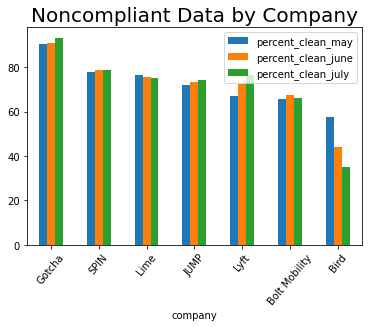

In [403]:
fig2 = xyz.plot(kind='bar')
plt.xticks(rotation=50)
fig2.set_title('Noncompliant Data by Company', fontsize=20)
plt.legend(loc=)

plt.savefig('../images/noncompliant_data.png')

In [404]:
may_trip.describe()

,tripDuration,tripDistance,startLatitude,startLongitude,endLatitude,endLongitude,seconds,minutes,avg_rides_day
count,156320.000000,156320.000000,156320.000000,156320.000000,156320.000000,156320.000000,156320.000000,156320.000000,156320.000000
mean,22.524736,2336.396540,36.154780,-86.784007,36.155179,-86.784119,581.114500,9.685242,1.573473
std,102.663723,2346.099949,0.013520,0.013331,0.019613,0.081653,359.525777,5.992096,1.349677
min,1.000000,0.083756,36.044707,-86.918008,32.775953,-117.076117,60.000000,1.000000,0.032258
25%,5.000000,389.229600,36.149850,-86.791213,36.150100,-86.791131,299.000000,4.983333,0.645161
50%,8.366667,1321.308000,36.156700,-86.781473,36.156980,-86.781495,495.278333,8.254639,1.290323
75%,13.633333,3887.748000,36.162592,-86.776290,36.162530,-86.776370,791.849999,13.197500,2.225806
max,1643.000000,8759.840000,36.293024,-86.608901,39.768425,-77.021907,1651.600000,27.526667,13.967742


In [341]:
july_trip.companyName.value_counts()

Lime             28823
Lyft             22154
Bird             15458
SPIN              9187
Bolt Mobility     4468
JUMP              3044
Gotcha             804
Name: companyName, dtype: int64